In [1]:
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import matplotlib.pyplot as plt

import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import warnings; warnings.filterwarnings('ignore')
import matplotlib.path as mpath

import sys; sys.path.append("..")
from dataset_manipulation import *
from palette import *
from plot import *
%matplotlib inline

In [2]:
fig_folder = '../../figures/results/'

import matplotlib.colors as colors

class MidpointNormalize(colors.Normalize):
#https://matplotlib.org/3.2.2/gallery/userdemo/colormap_normalizations_custom.html
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
    
def set_colorbar(ds, kwargs):
    if 'vmax' in list(kwargs.keys()):
        vmax = kwargs['vmax']
        kwargs['vmin'] = - vmax
    if 'cbar_kwargs' in list(kwargs.keys()):
        kwargs['cbar_kwargs']['ticks'] = [-vmax, -vmax*0.5, 0, vmax*0.5, vmax]
    if not 'norm' in list(): kwargs['norm'] = MidpointNormalize(midpoint=0.)
    #if 'levels' in list(kwargs.keys()):
        #ds = ds.where(ds!=0.)
    
def plot_difference_map(da_dict, case1, case2, variable, ax = None, relative=False, cmap='RdBu_r', boreal_lat=45., **kwargs):
    
    da1 = da_dict[case1][variable].mean('time')
    da2 = da_dict[case2][variable].mean('time')
    if variable=='ACTNL' or variable=='ACTREL':
        da1 = da_dict[case1][variable].mean('time')/da_dict[case1]['FCTL'].mean('time')
        da2 = da_dict[case2][variable].mean('time')/da_dict[case2]['FCTL'].mean('time')
    diff = (da1-da2)
    if relative:
        diff = diff/da2*100
        if not 'vmax' in list(kwargs.keys()): kwargs = dict(vmax=100, **kwargs)
    if variable =='N_AER': diff=diff.isel(lev=-1)
        
    set_colorbar(diff, kwargs)

    boreal_map(diff, ax = ax, title=case1+' – '+case2, cmap=cmap, extent_lat = boreal_lat, units = '%' if relative else None, **kwargs)
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages(ds_dict, variable, title, relative = False, **kwargs):
    
    fig, axes = plt.subplots(3,2, figsize=[12,18], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    plot_difference_map(ds_dict, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[0], relative=relative, **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'CTRL', variable, ax=axes.flat[1], relative=relative, **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[2], relative=relative, **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[3], relative=relative, **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-OFF', 'CTRL', variable, ax=axes.flat[4], relative=relative, **kwargs)
    plot_difference_map(ds_dict, 'REAL-OFF', 'CTRL', variable, ax=axes.flat[5], relative=relative, **kwargs)
    plt.suptitle(title)
    figtitle = fig_folder+variable
    if relative: figtitle=figtitle+'_relative'
    plt.savefig(figtitle+'.pdf')
    plt.show()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, seasons = ['DJF', 'JJA'], boreal_lat=45., relative = False, **kwargs):
    
    da1 = da_dict[case1][variable].groupby('time.season').mean('time')
    da2 = da_dict[case2][variable].groupby('time.season').mean('time')
    
    if variable=='ACTNL' or variable=='ACTREL':
        da1 = da_dict[case1][variable].groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')
        da2 = da_dict[case2][variable].groupby('time.season').mean('time')/da_dict[case2]['FCTL'].groupby('time.season').mean('time')
    diff = (da1-da2)
    if relative:
        diff = diff/da2*100
        if not 'vmax' in list(kwargs.keys()): kwargs = dict(vmax=100, **kwargs)
    
    if variable=='N_AER': diff=diff.isel(lev=-1)
        
    set_colorbar(diff, kwargs)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, units = '%' if relative else None, **kwargs)
    plt.subplots_adjust(bottom=0.3, top=0.8)
    plt.suptitle(case1+' – '+case2, y=0.9,size=18)
    plt.tight_layout()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[20,30], dpi=300, relative = False, cbar_kwargs = {},**kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4.*1.3, figsize[1]/6.], dpi=dpi, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    figs = []
    axes = []
    for i, cases in enumerate([['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL'], ['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-OFF', 'CTRL'], ['REAL-OFF', 'CTRL']]):
        fig, ax = plt.subplots(**plot_args)
        axes.append(ax)
        plot_difference_map_winter_summer(axes[i], ds_dict, *cases, variable, relative = relative, cbar_kwargs=dict(shrink=1.1, aspect=25, **cbar_kwargs), **kwargs)
        figs.append(fig)
    
    a_list = []
    for fig in figs:
        c = fig.canvas
        c.draw()
        a_list.append(np.array(c.buffer_rgba()))
        
    a_top = np.hstack(a_list[:2])
    a_middle = np.hstack(a_list[2:4])
    a_bottom = np.hstack(a_list[4:])
    a = np.vstack((a_top, a_middle, a_bottom))
        
    mpl.use(backend)
    fig,ax = plt.subplots(figsize=figsize)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle(title, size=33, y=0.9)
    figtitle = fig_folder+variable+'_seasons'
    if relative: figtitle=figtitle+'_relative'
    plt.savefig(figtitle+'.pdf')
    plt.show()

In [3]:
#plt.rcParams.keys()

In [4]:
"""plt.rcParams.update({
"text.usetex": True,
"font.family": 'DejaVu Sans',
"font.serif": ["Computer Modern Roman"],
"font.size": 20})"""
plt.rcParams['font.size'] = '15'

In [5]:
casealias = ['CTRL','IDEAL-ON', 'IDEAL-OFF', 'REAL-ON', 'REAL-OFF']
dpi = 300
relative = True

In [6]:
def load_dataset_dict(variable, cases=casealias, boreal_lat=45.):
    processed_path = '../../processed-data/postprocessing/' #/Users/adelezaini/Desktop/master-thesis/processed-data/output/IDEAL-ON_BVOC_20082012.nc
    date = '20082012'
    ds_dict = {}
    for case in cases:
        ds = xr.open_dataset(processed_path+case+'_'+variable+'_'+date+'.nc')
        ds = convert360_180(ds)
        #ds_dict[case] = ds.where(ds.LANDFRAC.mean('time')>0.)
        ds_dict[case]= ds.where(ds.lat>boreal_lat, drop=True)
    return ds_dict

# BVOC

In [7]:
bvoc = load_dataset_dict('BVOC')
##LANDFRAC
lnd_frac=bvoc['CTRL'].LANDFRAC.mean('time')

## Isoprene

In [8]:
"""bvoc_cmp = sequential_colormap('#0a5f38', '#fafaf4')
fig, axes = plt.subplots(3,2, sharex=True, sharey=True, figsize=[12,24], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias):
    boreal_map(bvoc[case]['SFisoprene'].mean('time').where(bvoc[case]['SFisoprene'].mean('time')>0.),ax = axes.flat[i],extent_lat =45.,
                   title=case, vmax = 2000, levels=11, cmap=bvoc_cmp)"""

"bvoc_cmp = sequential_colormap('#0a5f38', '#fafaf4')\nfig, axes = plt.subplots(3,2, sharex=True, sharey=True, figsize=[12,24], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias):\n    boreal_map(bvoc[case]['SFisoprene'].mean('time').where(bvoc[case]['SFisoprene'].mean('time')>0.),ax = axes.flat[i],extent_lat =45.,\n                   title=case, vmax = 2000, levels=11, cmap=bvoc_cmp)"

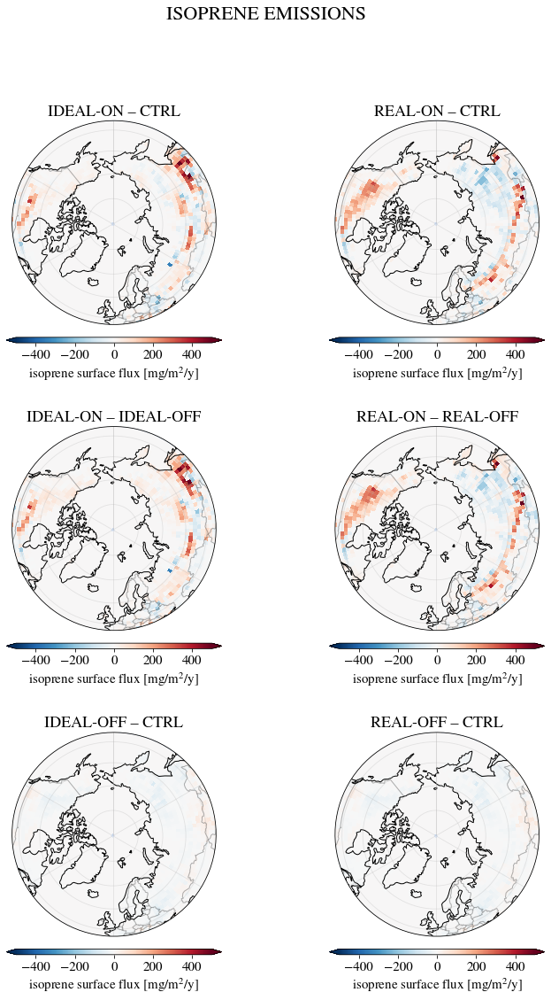

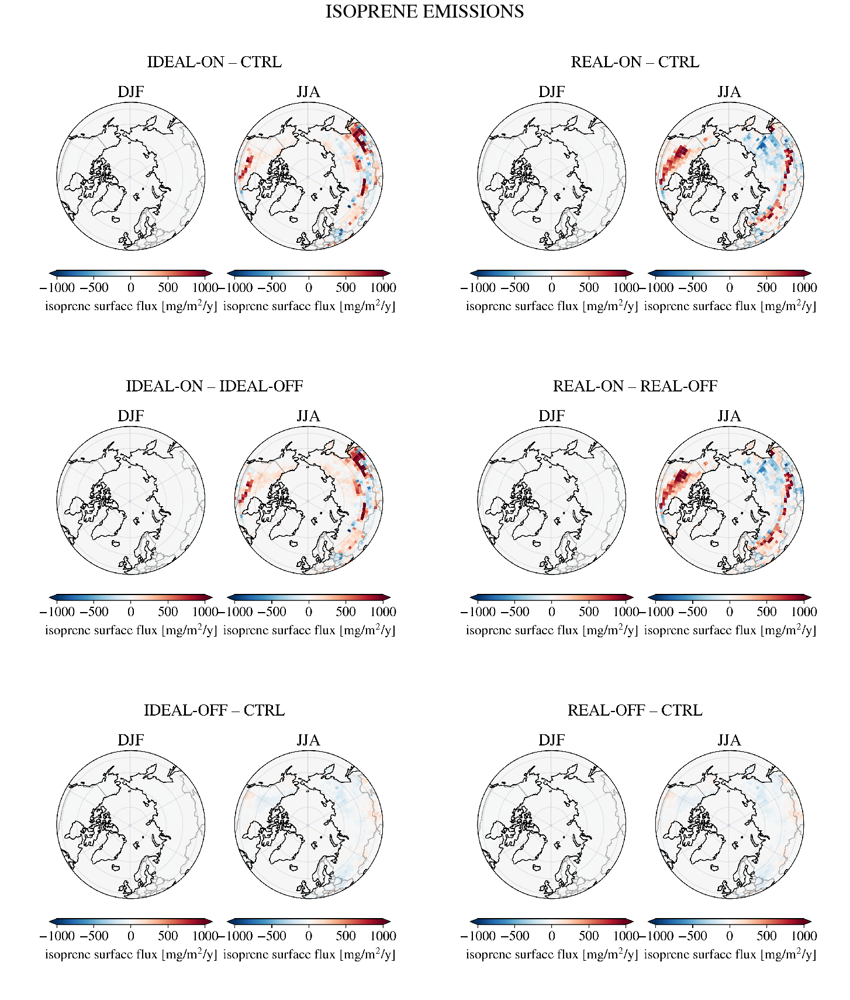

In [9]:
ds = bvoc
variable = 'SFisoprene'
title = 'ISOPRENE EMISSIONS'
spatial_averages(ds, variable, title, vmax=500, relative = False)
spatial_averages_winter_summer(ds, 'SFisoprene', title, dpi=dpi, vmax=1000, relative=False)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

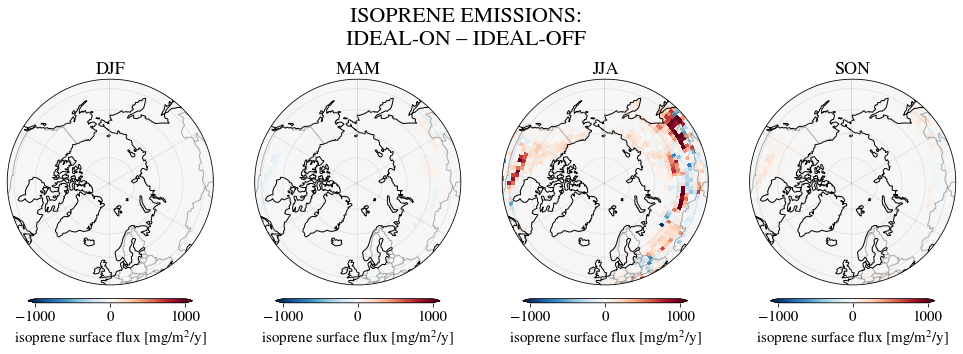

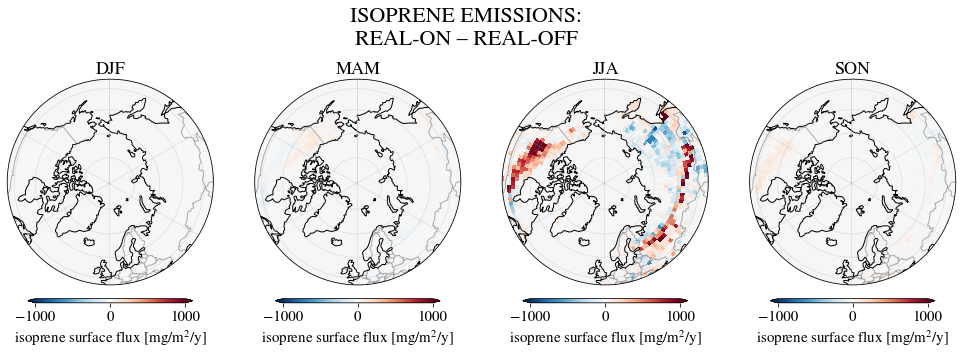

In [10]:
plot_difference_map_4seasons(ds, 'IDEAL-ON', 'IDEAL-OFF', variable, title, vmax=1000, relative = False)
plot_difference_map_4seasons(ds, 'REAL-ON', 'REAL-OFF', variable, title, vmax=1000, relative = False)

## Monoterpenes

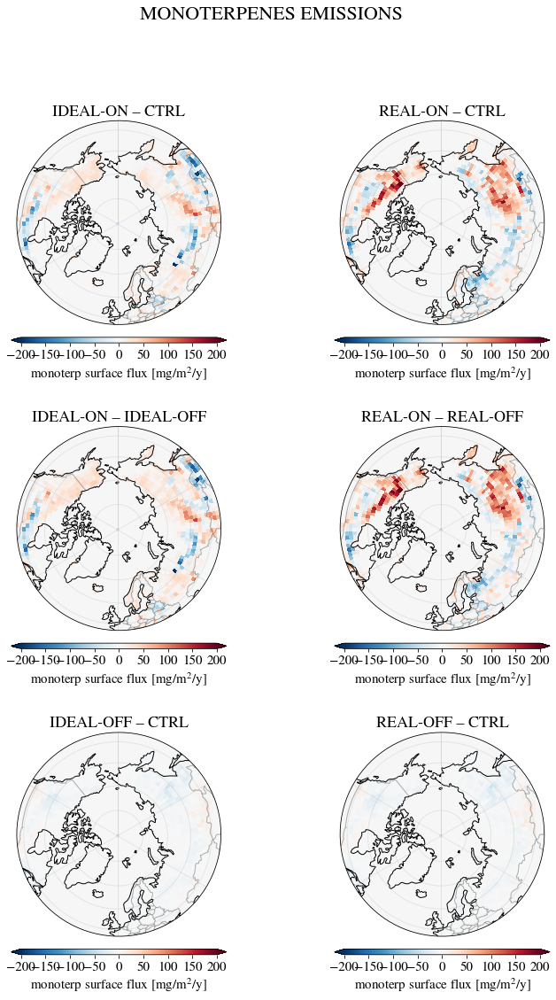

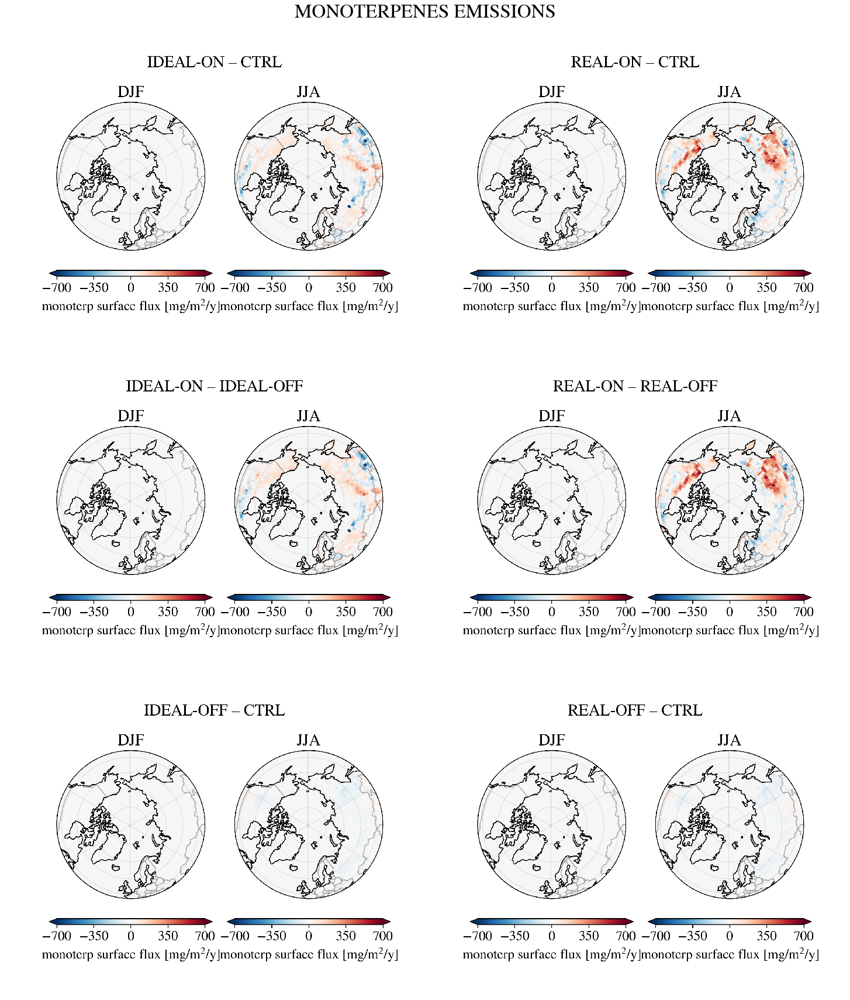

In [11]:
ds = bvoc
variable = 'SFmonoterp'
title = 'MONOTERPENES EMISSIONS'
spatial_averages(ds, variable, title, vmax=200, relative=False)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=700, relative=False)#, cbar_kwargs = dict(ticks=[-800, -400, 0, 400, 800]))

## SOA: column burden

In [12]:
def fix_names_soa(ds):
    """Assign clearer and more meaningful names"""
    
    ds_ = ds.copy(deep=True)
    
    for var in list(ds_.keys()):
        
        if var == "SOA_A1":
            ds_[var].attrs["long_name"] = "SOA_A1 concentration"
        elif var == "SOA_NA":
            ds_[var].attrs["long_name"] = "SOA_NA concentration"
        elif var == "cb_SOA_A1":
            ds_[var].attrs["long_name"] = "SOA_A1 burden column"
        elif var == "cb_SOA_NA":
            ds_[var].attrs["long_name"] = "SOA_NA burden column"
        elif var == "cb_SOA_A1_OCW":
            ds_[var].attrs["long_name"] = "SOA_A1 burden column in cloud water"
        elif var == "cb_SOA_NA_OCW":
            ds_[var].attrs["long_name"] = "SOA_NA burden column in cloud water"
        
        else:
            continue
    return ds_

def fix_soa(ds):
    """ Convert some units to have a more meaningful representation """
    
    ds_ = ds.copy(deep=True)
    
    for var in list(ds_.keys()):
            
        if var == "N_AER":
            ds_[var].attrs["units"] = "cm$^{-3}$" # Set unit to cm-3
        else:
            continue
        return ds_

In [13]:
soa = load_dataset_dict('SOA')
for case in casealias:
    soa[case] = fix_soa(fix_names_soa(soa[case]))
    soa[case]['cb_SOA_TOT'] = soa[case]['cb_SOA_NA'] + soa[case]['cb_SOA_A1']
    soa[case]['cb_SOA_TOT'].attrs['long_name'] = "total SOA burden column"

In [14]:
"""cmp = sequential_colormap('#1f6357', '#fafaf4')
fig, axes = plt.subplots(3,2, sharex=True, sharey=True, figsize=[15,17], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias):
    boreal_map(soa[case]['cb_SOA_TOT'].mean('time'),ax = axes.flat[i], extent_lat =45.,
                   title=case, cmap=cmp)"""

"cmp = sequential_colormap('#1f6357', '#fafaf4')\nfig, axes = plt.subplots(3,2, sharex=True, sharey=True, figsize=[15,17], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias):\n    boreal_map(soa[case]['cb_SOA_TOT'].mean('time'),ax = axes.flat[i], extent_lat =45.,\n                   title=case, cmap=cmp)"

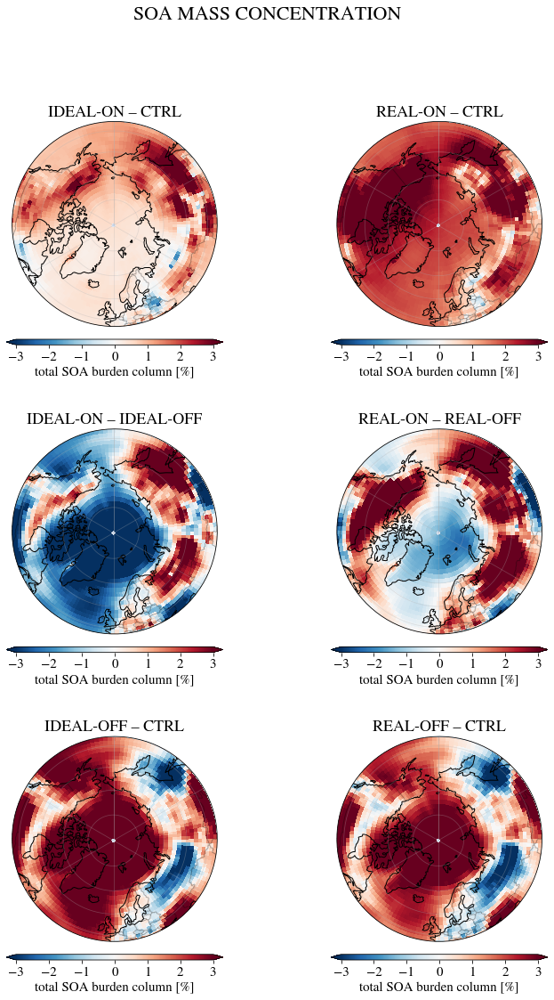

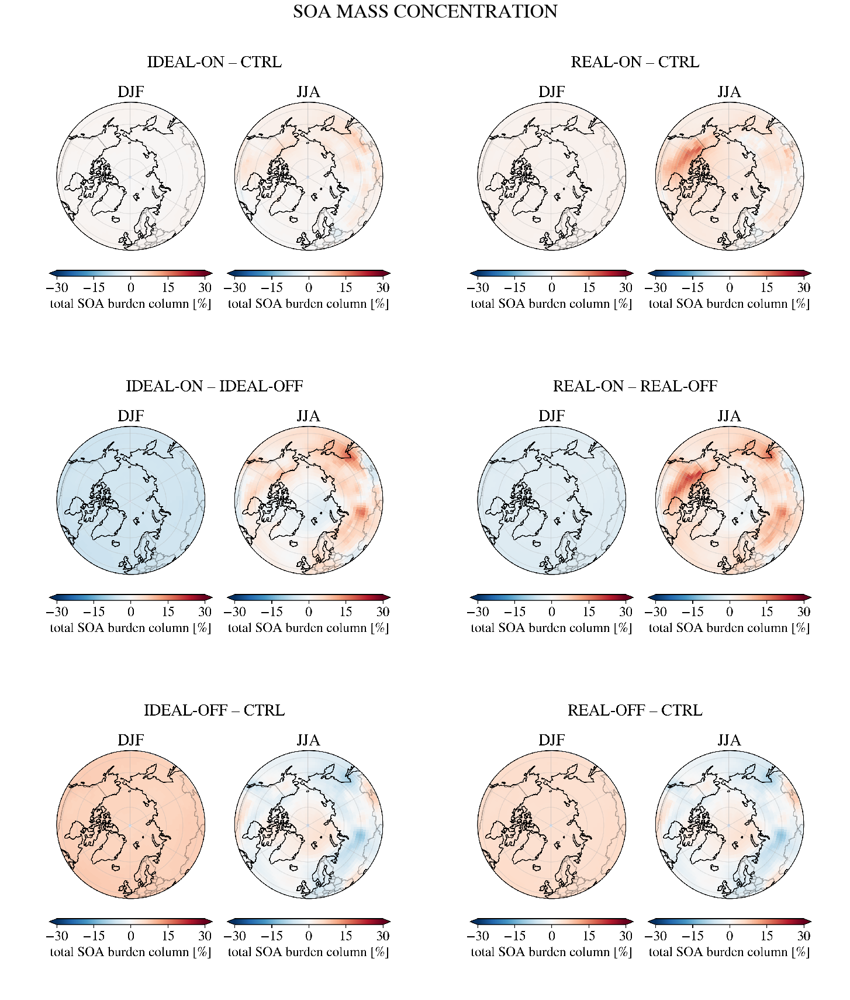

In [30]:
ds = soa
variable = 'cb_SOA_TOT'
title = 'SOA MASS CONCENTRATION'
relative=True

spatial_averages(ds, variable, title, vmax=0.2 if not relative else 3, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=0.6 if not relative else 30, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

# Aerosol optical depth

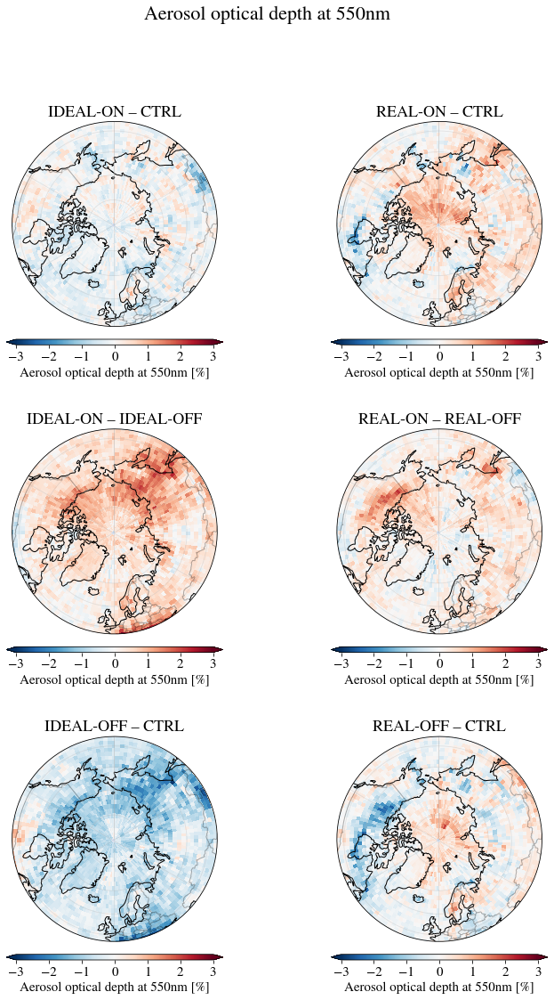

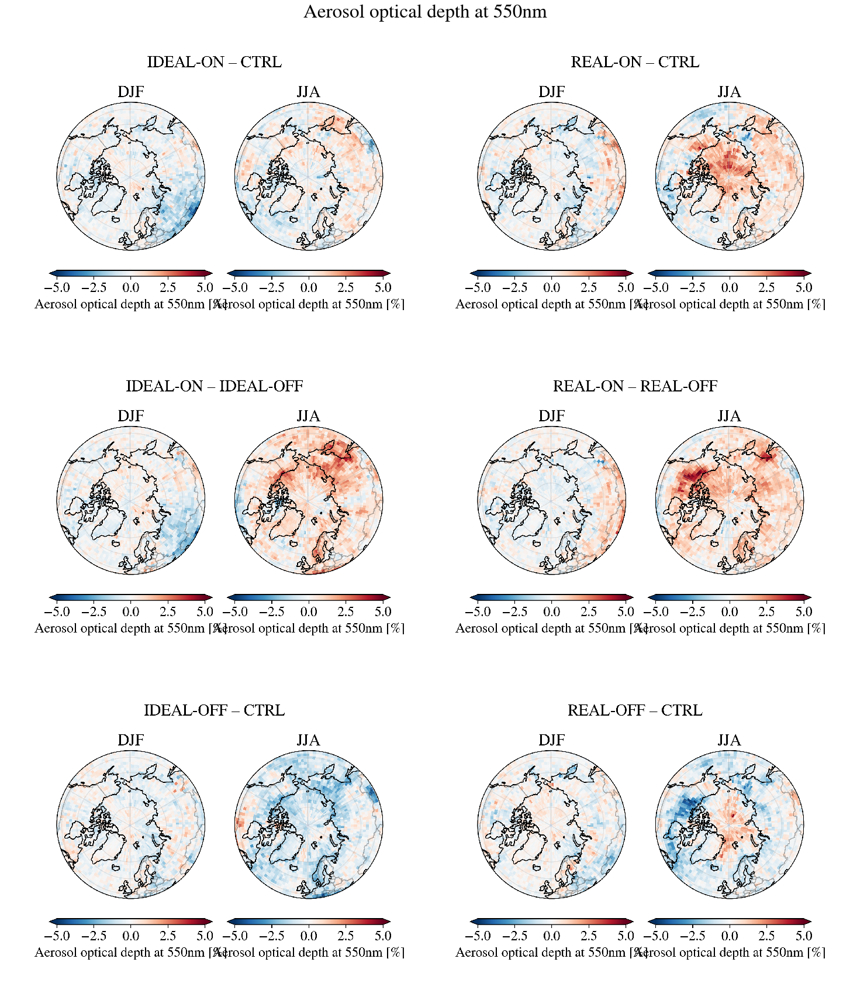

In [16]:
ds = soa
variable = 'DOD550'
title = 'Aerosol optical depth at 550nm'

spatial_averages(ds, variable, title, vmax=0.002 if not relative else 3, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=0.005 if not relative else 5, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

## N_AER

In [17]:
"""bvoc_cmp = sequential_colormap('#894585', '#fafaf4')
fig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias[2:]):
    boreal_map(soa[case]['N_AER'].mean('time').isel(lev=-1),ax = axes.flat[i], extent_lat =45.,
                   title=case, cmap=bvoc_cmp)"""

"bvoc_cmp = sequential_colormap('#894585', '#fafaf4')\nfig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias[2:]):\n    boreal_map(soa[case]['N_AER'].mean('time').isel(lev=-1),ax = axes.flat[i], extent_lat =45.,\n                   title=case, cmap=bvoc_cmp)"

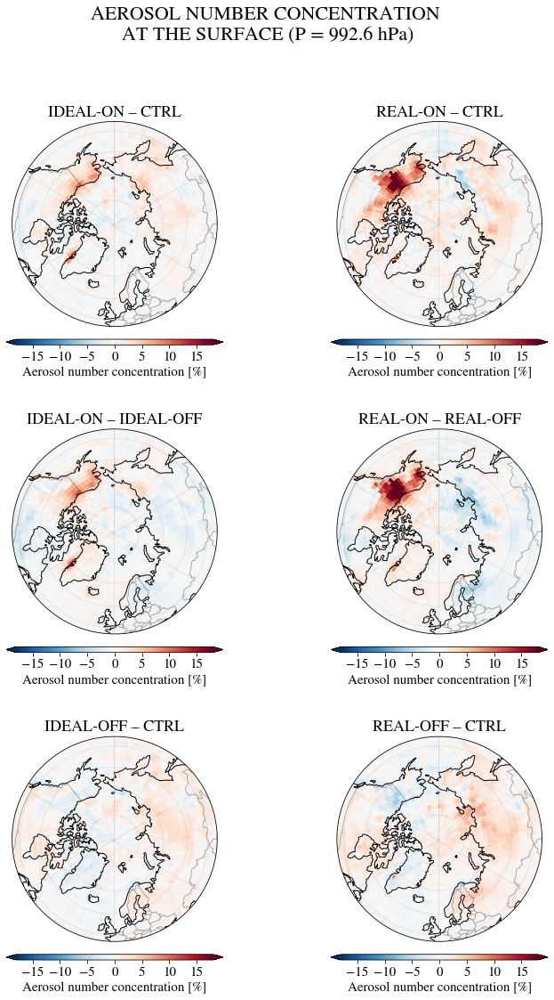

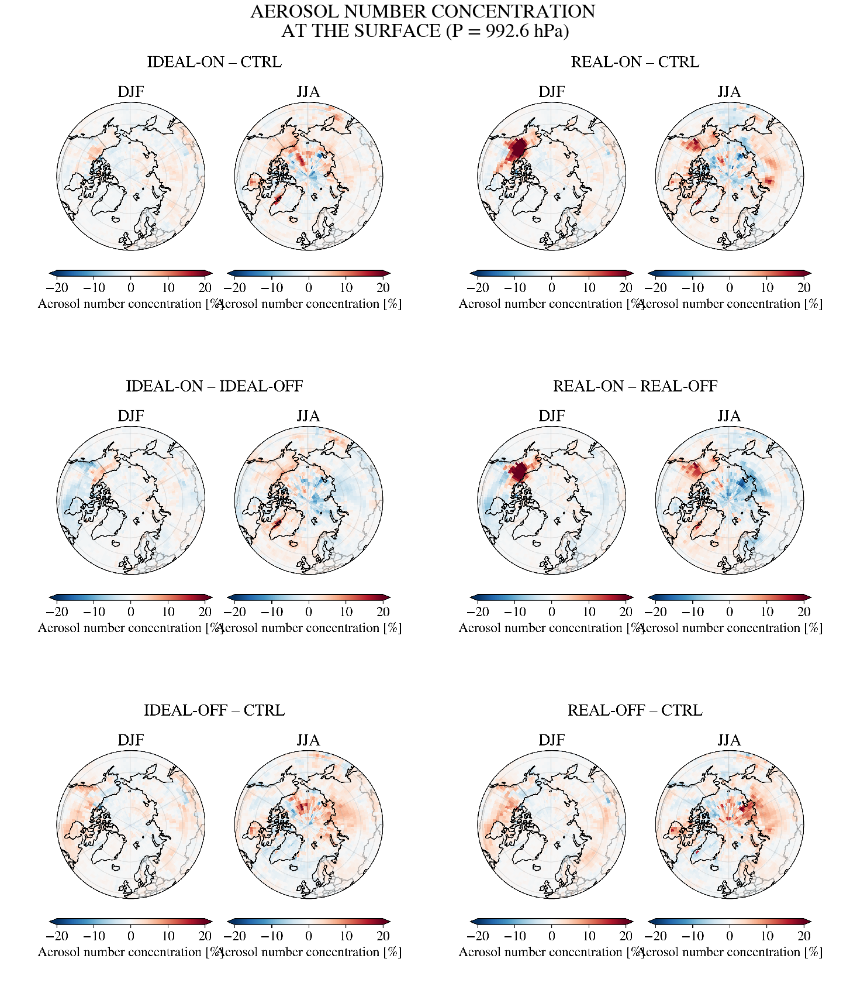

In [18]:
ds = soa
variable = 'N_AER'
title = 'AEROSOL NUMBER CONCENTRATION \nAT THE SURFACE (P = 992.6 hPa)'
spatial_averages(ds, variable, title, vmax=80 if not relative else 18, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=150 if not relative else 20, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

## Cloud properties

In [19]:
"""def plot_difference(da_dict, case1, case2, variable, ax = None, lev=False, **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')
    if lev: diff=diff.sum('lev').where(da_dict[case1].LANDFRAC.mean('time')>0.)
    single_pft_map(diff, ax = ax, title=case1+' – '+case2, cmap='RdBu_r', extent_lat =45.,**kwargs)"""

"def plot_difference(da_dict, case1, case2, variable, ax = None, lev=False, **kwargs):\n    \n    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')\n    if lev: diff=diff.sum('lev').where(da_dict[case1].LANDFRAC.mean('time')>0.)\n    single_pft_map(diff, ax = ax, title=case1+' – '+case2, cmap='RdBu_r', extent_lat =45.,**kwargs)"

In [20]:
cloud = load_dataset_dict('CLOUDPROP')

def fix_cloud(ds):
    
    ds_ = ds.copy(deep=True)
    
    for var in list(ds_.keys()):
            
        if var == "ACTNL":
            ds_[var].values = ds_[var].values*1e-12
        else:
            continue
        return ds_
    
for case in casealias:
    cloud[case] = fix_cloud(cloud[case])

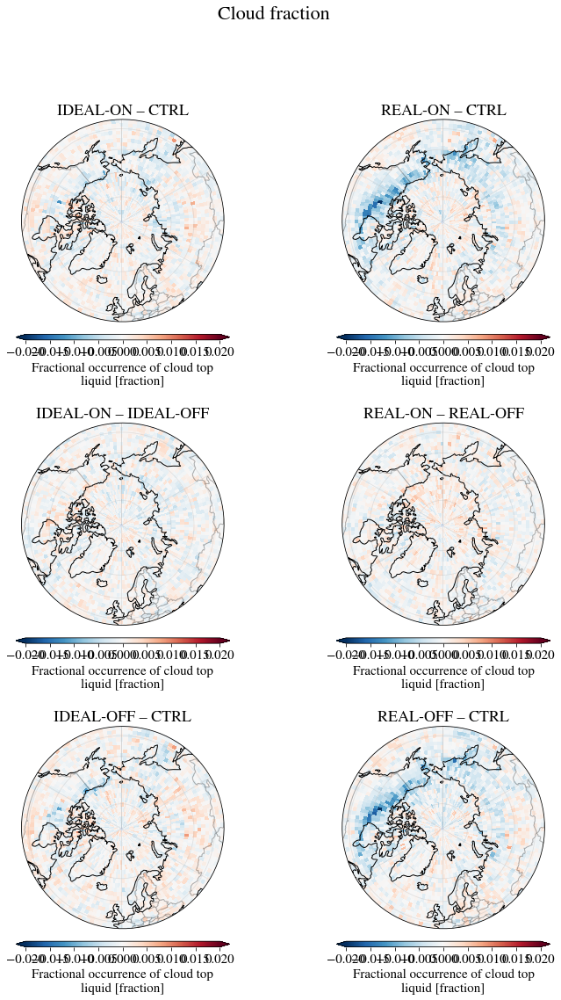

In [21]:
spatial_averages(cloud,'FCTL', 'Cloud fraction', vmax = 0.02)

### cloud droplet radius (cloud top)

In [22]:
"""cmp = sequential_colormap('#1f6357', '#fafaf4')
fig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias[1:]):
    boreal_map(cloud[case]['ACTREL'].mean('time'),ax = axes.flat[i], extent_lat =45.,
                   title=case, cmap=cmp)
plt.suptitle('Cloud droplet effective radius',size=20)
plt.show()"""

"cmp = sequential_colormap('#1f6357', '#fafaf4')\nfig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias[1:]):\n    boreal_map(cloud[case]['ACTREL'].mean('time'),ax = axes.flat[i], extent_lat =45.,\n                   title=case, cmap=cmp)\nplt.suptitle('Cloud droplet effective radius',size=20)\nplt.show()"

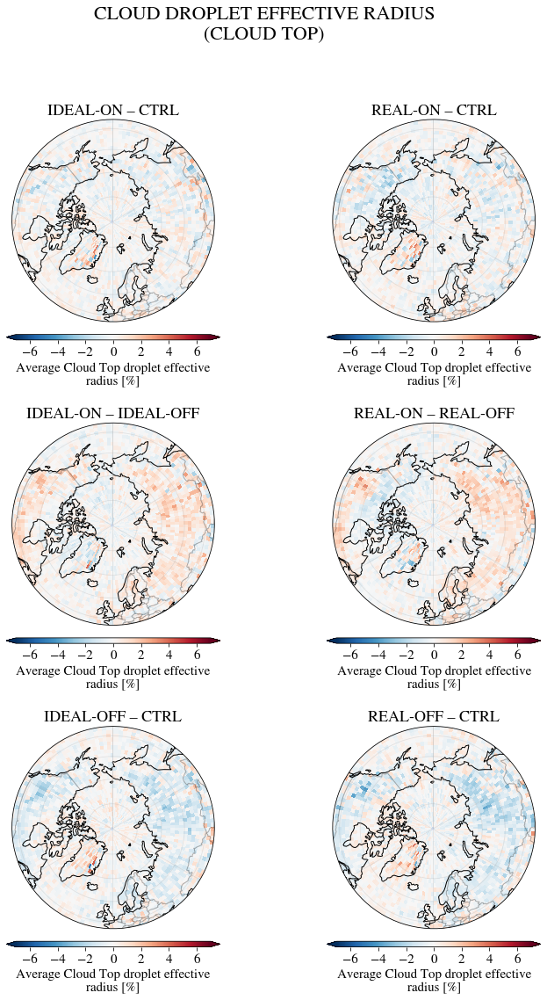

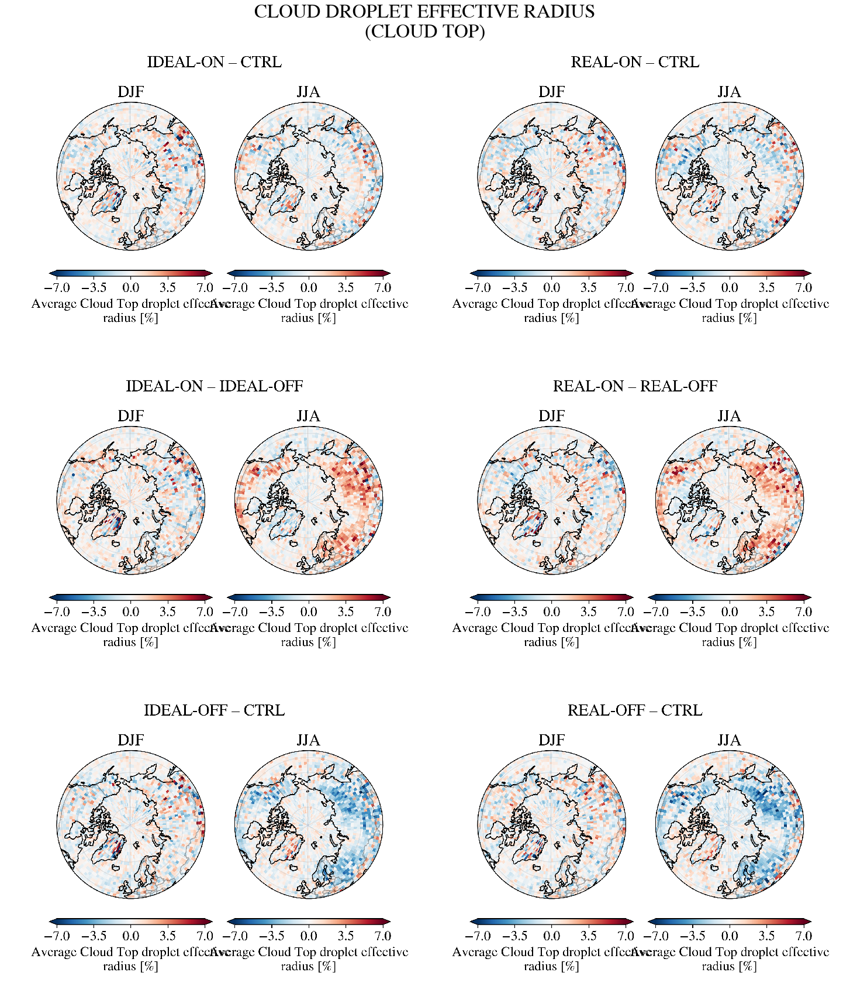

In [23]:
ds = cloud
variable = 'ACTREL'
title = 'CLOUD DROPLET EFFECTIVE RADIUS\n(CLOUD TOP)'
spatial_averages(ds, variable, title, vmax=-1000 if not relative else 7, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=-4000 if not relative else 7, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

### CDNC (cloud top)

In [24]:
"""cmp = sequential_colormap('#1f6357', '#fafaf4')
fig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias[1:]):
    boreal_map(cloud[case]['ACTNL'].mean('time'),ax = axes.flat[i], extent_lat =45.,
                   title=case, cmap=cmp)
plt.suptitle('Cloud droplet number concentration - cloud top',size=20)
plt.show()"""

"cmp = sequential_colormap('#1f6357', '#fafaf4')\nfig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias[1:]):\n    boreal_map(cloud[case]['ACTNL'].mean('time'),ax = axes.flat[i], extent_lat =45.,\n                   title=case, cmap=cmp)\nplt.suptitle('Cloud droplet number concentration - cloud top',size=20)\nplt.show()"

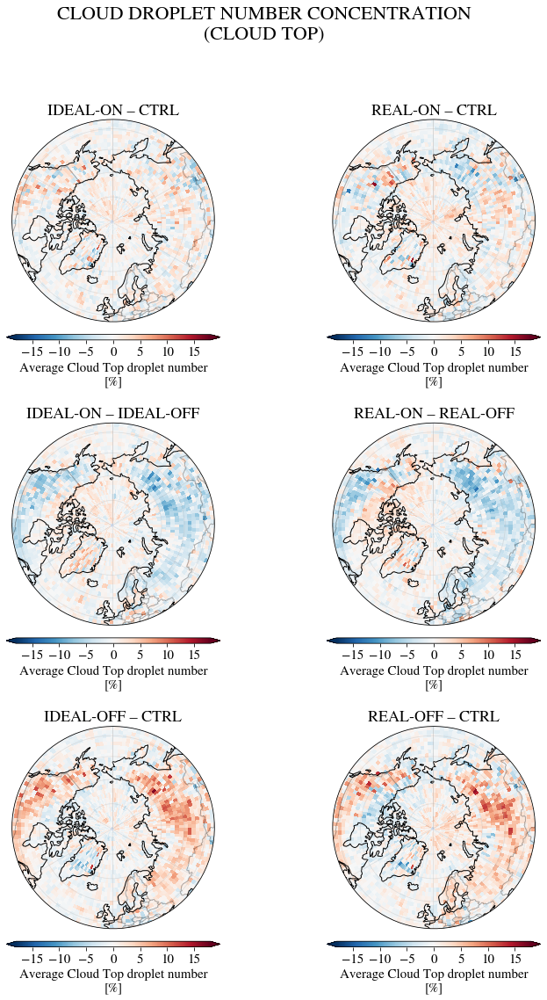

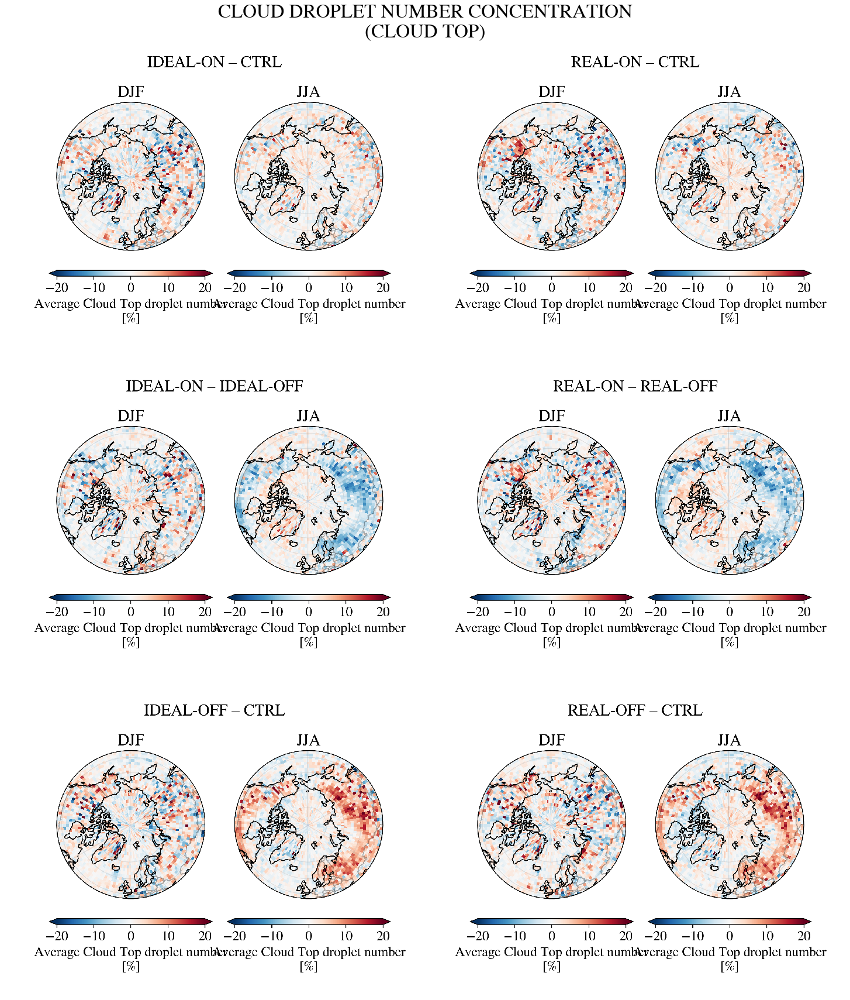

In [25]:
ds = cloud
variable = 'ACTNL'
title = 'CLOUD DROPLET NUMBER CONCENTRATION\n(CLOUD TOP)'
spatial_averages(ds, variable, title, vmax=+6000 if not relative else 18, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=7000 if not relative else 20, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

### LWP

In [26]:
"""cmp = sequential_colormap('#08787f', '#fafaf4')
fig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

for i, case in enumerate(casealias[1:]):
    boreal_map(cloud[case]['TGCLDLWP'].mean('time'),ax = axes.flat[i], extent_lat =45.,
                   title=case, cmap=cmp)
plt.suptitle('Liquid Water Path',size=20)
plt.show()"""

"cmp = sequential_colormap('#08787f', '#fafaf4')\nfig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[15,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)\n\nfor i, case in enumerate(casealias[1:]):\n    boreal_map(cloud[case]['TGCLDLWP'].mean('time'),ax = axes.flat[i], extent_lat =45.,\n                   title=case, cmap=cmp)\nplt.suptitle('Liquid Water Path',size=20)\nplt.show()"

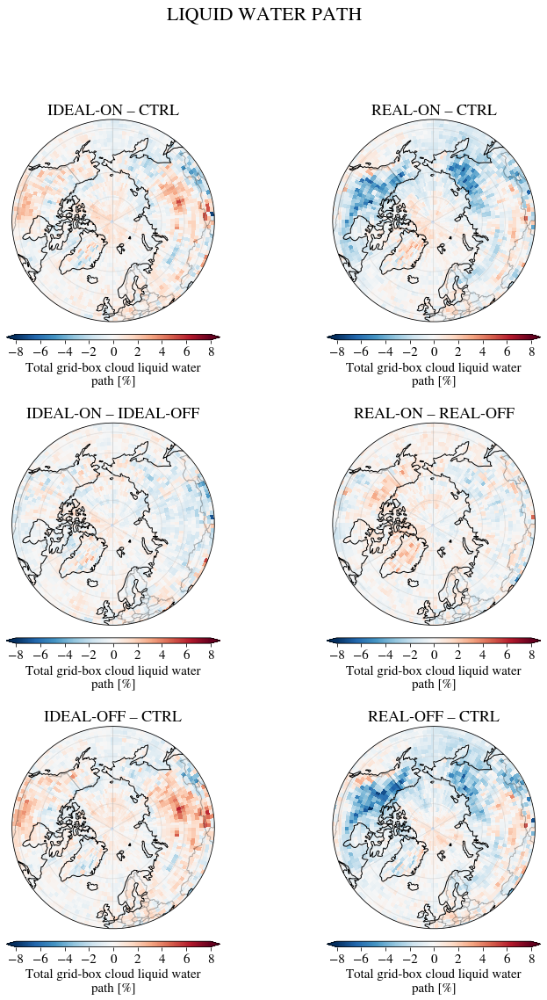

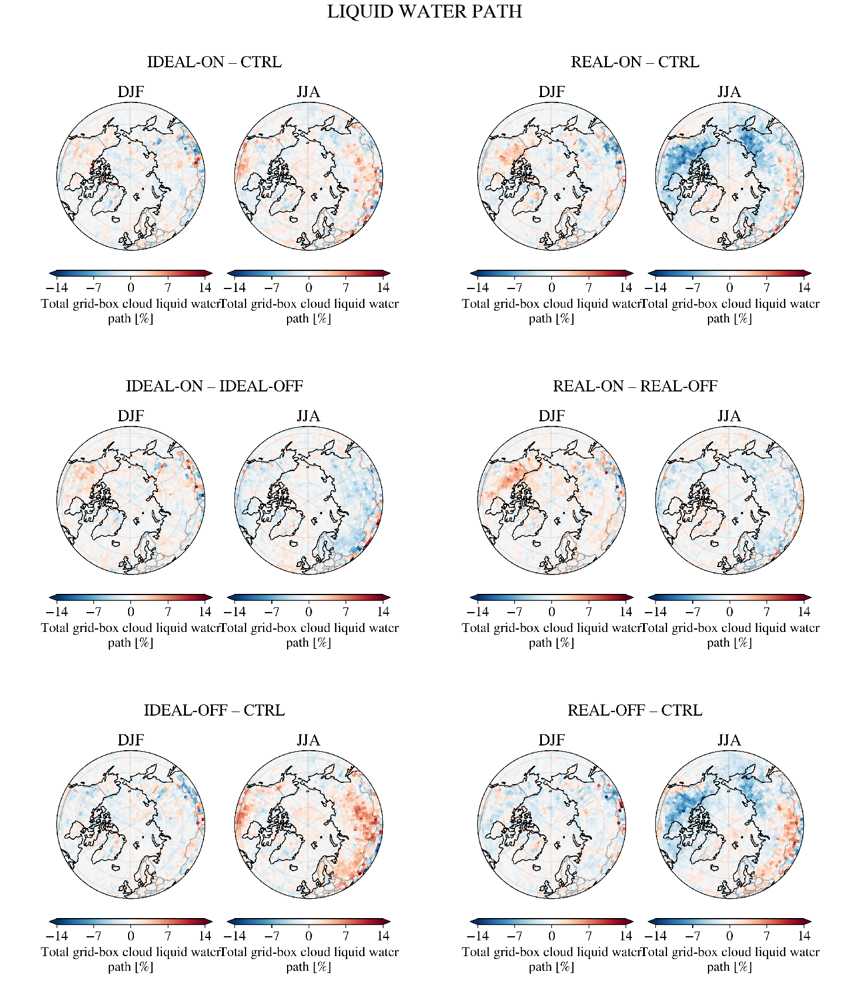

In [27]:
ds = cloud
variable = 'TGCLDLWP'
title='LIQUID WATER PATH'
spatial_averages(ds, variable, title, vmax=5. if not relative else 8, relative = relative)
spatial_averages_winter_summer(ds, variable, title, dpi=dpi, vmax=6. if not relative else 14, relative = relative)#, cbar_kwargs = dict(ticks=[-1000, -500, 0, 500, 1000]))

In [71]:
###### This python file collects fuctions to modify PFT configuration, such as in surfdata_map file

####### Import packages
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors

import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import warnings; warnings.filterwarnings('ignore')
import matplotlib.path as mpath
from textwrap import wrap

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['font.size'] = '16'
#plt.rcParams['figure.facecolor'] = 'none'
plt.rcParams['figure.titlesize'] = '22'
plt.rcParams['axes.titlesize'] = '18'

################ Miscellaneous ################
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def dict_to_legend(dct):
    """Support function for legend display.
      Convert a dict in the format {item1: amount1, item2:amount2...}
      into a list of strings in the format ['item1 - amount1', 'item2 - amount2', ...]
    """
    return ["{} – {}".format(item, amount) for item, amount in dct.items()]
    
def plot_title(title):
    """Plot the give title. Useful if plotting multiple figures, gathered under a same main title."""
    fig, ax = plt.subplots(1,1, figsize=(10, 0.5))
    ax.axis('off')
    plt.suptitle(title, weight='bold', size='xx-large', y=0.5)
    plt.show()
    
class MidpointNormalize(colors.Normalize):
#https://matplotlib.org/3.2.2/gallery/userdemo/colormap_normalizations_custom.html
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

################ Projections ################
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def ax_map_properties(ax, alpha=0.3, coastlines=True, gridlines=True, earth = False, ocean=True, land=True, borders=True, rivers=True, provinces=False):
    """Set default map properties on the axis"""
    if coastlines: ax.coastlines()
    if gridlines: ax.gridlines(alpha=0.3)
    if ocean: ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=alpha)
    if land: ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=alpha)
    if borders: ax.add_feature(cfeature.BORDERS, alpha=0.3)
    if rivers: ax.add_feature(cfeature.RIVERS)
    if earth: ax.stock_img()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def cut_extent_Orthographic(ax, lat=None, extent=None):
    """Return circle where to cut the circular plot, given the latitude"""
    if extent:
        ax.set_extent(extent, crs = ccrs.PlateCarree())
    elif lat:
        ax.set_extent([-180,180, lat,90], crs = ccrs.PlateCarree())
    else:
        ax.set_extent([-180,180,-90,90], crs = ccrs.PlateCarree())
    # Compute a circle in axes coordinates, which we can use as a boundary for the map.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
        
######### Maps ###############
fig_folder = '../../figures/results/'
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def boreal_map(da, title, figsize = [10,8], ax=None, projection=ccrs.Orthographic(0, 90), extent_lat = None,
                   grid=True, earth=False, contourf=False, cbar_kwargs={}, **kwargs):
    """Plot a spatial distribution of 'da', specially adapted for boreal and artic area.
    Args:
        - da (xr.DataArray): variable to plot with dimension [lat,lon]
        - ax (matplotlib.axes.Axes): axis to plot on. Optional. If None, a figure is created.
        - figsize (tuple): figure size (if ax=None)
        - projection (ccrs.): geographical projection
        - extent_lat (float): latitude over which the distribution will be depicted
        - grid (bool): display grid lines
        - earth (bool): display earth background
        - contourf (bool): contourf plot type. Default: pcolormesh
        - cbar_kwargs (dict): colorbar arguments
        - kwargs (dict): arguments to pass to the xr.da.plot()
    """
    
    
    # Add axis if it not given - useful to plot multiple subplots in one figure
    if not ax:
        fig = plt.figure(1, figsize=figsize)#,dpi=100)
        ax = plt.axes(projection=projection)

    # Zoom on the map according to boreal_lat
    # Opposite of ax.set_global()
    if extent_lat: cut_extent_Orthographic(ax, extent_lat)

    # Gather all the arguments of the plot
    plot_args = dict(ax=ax, x='lon', y='lat', transform=ccrs.PlateCarree(), add_colorbar=False, **kwargs)
    
    # If not plot.contourf -> plot.pcolormesh
    if not contourf: p = da.plot(**plot_args) #pcolormesh
    else: p = da.plot.contourf(**plot_args)
        
    # Add common colorbar
    for arg in ['location', 'pad', 'shrink', 'aspect', 'extend']:
        if not arg in list(cbar_kwargs.keys()):
            if arg == 'location': cbar_kwargs[arg] = 'bottom'
            if arg == 'pad': cbar_kwargs[arg] =  0.05
            if arg == 'shrink': cbar_kwargs[arg] = 0.8
            if arg == 'aspect': cbar_kwargs[arg] = 35
            if arg == 'extend': cbar_kwargs[arg] = 'both'
            #if arg == 'label': cbar_kwargs[arg] = da.long_name+'\n['+da.units+']'
    cbar = plt.colorbar(p, ax = [ax], **cbar_kwargs)
    cbar.set_label("\n".join(wrap(da.long_name+'\n['+da.units+']', 30)))
    #cbar = plt.colorbar(p, ax = [ax], location = 'bottom', pad=0.05,shrink=0.8, aspect=40, extend='both', **cbar_kwargs, label=da.long_name+'\n['+da.units+']')#'PTF on the natveg landunit [% of landunit]')

    # Costum axis features
    ax_map_properties(ax, gridlines=grid, earth=earth, rivers=False)
    if projection==ccrs.PlateCarree(): ax.set_aspect('auto')
    ax.set_title(title)#, weight='bold') #size='x-large'
    if not ax: plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map(da_dict, case1, case2, variable, ax = None, cmap='RdBu_r', boreal_lat=45., **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))#/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da_dict[case1][variable].mean('time')/da_dict[case1]['FCTL'].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case2]['FCTL'].mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    boreal_map(diff, ax = ax, title=case1+' – '+case2, cmap=cmap, extent_lat = boreal_lat, **kwargs)
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages(ds_dict, variable, title, **kwargs):
    
    fig, axes = plt.subplots(2,2, figsize=[12,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    plot_difference_map(ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[0], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[1], **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[2], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'CTRL', variable, ax=axes.flat[3], **kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+variable+'.pdf')
    plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_4seasons(da_dict, case1, case2, variable, title, **kwargs):
    seasons = ['DJF', 'MAM','JJA', 'SON']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case2]['FCTL'].groupby('time.season').mean('time')
        #ds_[var] = ds_[var].where((ds_['FCTL'] != 0))
    if variable=='N_AER': diff=diff.isel(lev=-1)
        
    fig, axes = plt.subplots(1,4, figsize=[17,5], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    
    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i], title=season, cmap='RdBu_r', extent_lat =45.,**kwargs)
    plt.suptitle(title+':\n'+case1+' – '+case2, y=1.05)
    plt.show()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, boreal_lat=45.,**kwargs):
    seasons = ['DJF', 'JJA']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case2]['FCTL'].groupby('time.season').mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, **kwargs)
    plt.subplots_adjust(bottom=0.3, top=0.8)
    plt.suptitle(case1+' – '+case2, y=0.9,size=18)
    plt.tight_layout()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[20,20], dpi=300, cbar_kwargs = {},**kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4.*1.3, figsize[1]/4.], dpi=dpi, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    figs = []
    axes = []
    for i, cases in enumerate([['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL']]):
        fig, ax = plt.subplots(**plot_args)
        axes.append(ax)
        plot_difference_map_winter_summer(axes[i], ds_dict, *cases, variable, cbar_kwargs=dict(shrink=1.1, aspect=25, **cbar_kwargs), **kwargs)
        figs.append(fig)
    
    a_list = []
    for fig in figs:
        c = fig.canvas
        c.draw()
        a_list.append(np.array(c.buffer_rgba()))
        
    a_top = np.hstack(a_list[:2])
    a_bottom = np.hstack(a_list[2:])
    a = np.vstack((a_top, a_bottom))
        
    mpl.use(backend)
    fig,ax = plt.subplots(figsize=figsize)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle(title, size=33, y=0.9)
    plt.savefig(fig_folder+variable+'_seasons.pdf')
    plt.show()


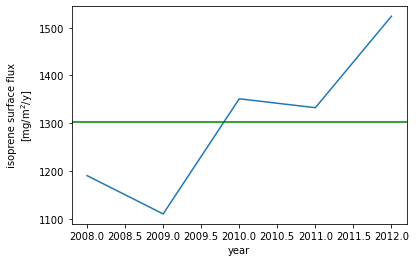

In [15]:
bvoc['CTRL']['SFisoprene'].groupby('time.year').sum('time').mean(['lon', 'lat']).plot()
plt.axhline(y=1301.7117, color='g', linestyle='-')
plt.show()

In [94]:
print('Mean over time, after integrating over the year:')
bvoc['CTRL']['SFisoprene'].groupby('time.year').sum('time').mean(['lon', 'lat']).mean('year').values/12

Mean over time, after integrating over the year:


108.47597249348958

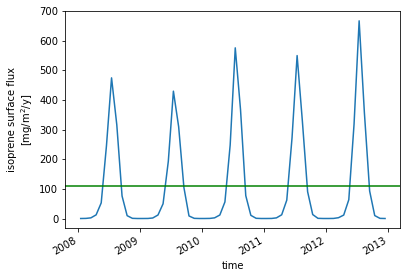

In [14]:
bvoc['CTRL']['SFisoprene'].mean(['lon', 'lat']).plot()
plt.axhline(y=108.475975, color='g', linestyle='-')
plt.show()

In [109]:
print('Mean over time, directly:')
bvoc['CTRL']['SFisoprene'].mean(['lon', 'lat']).mean('time').values

Mean over time, directly:


array(108.475975, dtype=float32)

In [67]:
###### This python file collects fuctions to modify PFT configuration, such as in surfdata_map file

####### Import packages
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors

import cartopy
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import warnings; warnings.filterwarnings('ignore')
import matplotlib.path as mpath
from textwrap import wrap

plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
plt.rcParams['font.size'] = '16'
#plt.rcParams['figure.facecolor'] = 'none'
plt.rcParams['figure.titlesize'] = '22'
plt.rcParams['axes.titlesize'] = '18'

################ Miscellaneous ################
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def dict_to_legend(dct):
    """Support function for legend display.
      Convert a dict in the format {item1: amount1, item2:amount2...}
      into a list of strings in the format ['item1 - amount1', 'item2 - amount2', ...]
    """
    return ["{} – {}".format(item, amount) for item, amount in dct.items()]
    
def plot_title(title):
    """Plot the give title. Useful if plotting multiple figures, gathered under a same main title."""
    fig, ax = plt.subplots(1,1, figsize=(10, 0.5))
    ax.axis('off')
    plt.suptitle(title, weight='bold', size='xx-large', y=0.5)
    plt.show()
    
class MidpointNormalize(colors.Normalize):
#https://matplotlib.org/3.2.2/gallery/userdemo/colormap_normalizations_custom.html
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

################ Projections ################
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def ax_map_properties(ax, alpha=0.3, coastlines=True, gridlines=True, earth = False, ocean=True, land=True, borders=True, rivers=True, provinces=False):
    """Set default map properties on the axis"""
    if coastlines: ax.coastlines()
    if gridlines: ax.gridlines(alpha=0.3)
    if ocean: ax.add_feature(cartopy.feature.OCEAN, zorder=0, alpha=alpha)
    if land: ax.add_feature(cartopy.feature.LAND, zorder=0, edgecolor='black', alpha=alpha)
    if borders: ax.add_feature(cfeature.BORDERS, alpha=0.3)
    if rivers: ax.add_feature(cfeature.RIVERS)
    if earth: ax.stock_img()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def cut_extent_Orthographic(ax, lat=None, extent=None):
    """Return circle where to cut the circular plot, given the latitude"""
    if extent:
        ax.set_extent(extent, crs = ccrs.PlateCarree())
    elif lat:
        ax.set_extent([-180,180, lat,90], crs = ccrs.PlateCarree())
    else:
        ax.set_extent([-180,180,-90,90], crs = ccrs.PlateCarree())
    # Compute a circle in axes coordinates, which we can use as a boundary for the map.
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
        
######### Maps ###############
fig_folder = '../../figures/results/'
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def boreal_map(da, title, figsize = [10,8], ax=None, projection=ccrs.Orthographic(0, 90), extent_lat = None,
                   grid=True, earth=False, contourf=False, cbar_kwargs={}, **kwargs):
    """Plot a spatial distribution of 'da', specially adapted for boreal and artic area.
    Args:
        - da (xr.DataArray): variable to plot with dimension [lat,lon]
        - ax (matplotlib.axes.Axes): axis to plot on. Optional. If None, a figure is created.
        - figsize (tuple): figure size (if ax=None)
        - projection (ccrs.): geographical projection
        - extent_lat (float): latitude over which the distribution will be depicted
        - grid (bool): display grid lines
        - earth (bool): display earth background
        - contourf (bool): contourf plot type. Default: pcolormesh
        - cbar_kwargs (dict): colorbar arguments
        - kwargs (dict): arguments to pass to the xr.da.plot()
    """
    
    
    # Add axis if it not given - useful to plot multiple subplots in one figure
    if not ax:
        fig = plt.figure(1, figsize=figsize)#,dpi=100)
        ax = plt.axes(projection=projection)

    # Zoom on the map according to boreal_lat
    # Opposite of ax.set_global()
    if extent_lat: cut_extent_Orthographic(ax, extent_lat)

    # Gather all the arguments of the plot
    plot_args = dict(ax=ax, x='lon', y='lat', transform=ccrs.PlateCarree(), add_colorbar=False, **kwargs)
    
    # If not plot.contourf -> plot.pcolormesh
    if not contourf: p = da.plot(**plot_args) #pcolormesh
    else: p = da.plot.contourf(**plot_args)
        
    # Add common colorbar
    for arg in ['location', 'pad', 'shrink', 'aspect', 'extend']:
        if not arg in list(cbar_kwargs.keys()):
            if arg == 'location': cbar_kwargs[arg] = 'bottom'
            if arg == 'pad': cbar_kwargs[arg] =  0.05
            if arg == 'shrink': cbar_kwargs[arg] = 0.8
            if arg == 'aspect': cbar_kwargs[arg] = 35
            if arg == 'extend': cbar_kwargs[arg] = 'both'
            #if arg == 'label': cbar_kwargs[arg] = da.long_name+'\n['+da.units+']'
    cbar = plt.colorbar(p, ax = [ax], **cbar_kwargs)
    cbar.set_label("\n".join(wrap(da.long_name+'\n['+da.units+']', 30)))
    #cbar = plt.colorbar(p, ax = [ax], location = 'bottom', pad=0.05,shrink=0.8, aspect=40, extend='both', **cbar_kwargs, label=da.long_name+'\n['+da.units+']')#'PTF on the natveg landunit [% of landunit]')

    # Costum axis features
    ax_map_properties(ax, gridlines=grid, earth=earth, rivers=False)
    if projection==ccrs.PlateCarree(): ax.set_aspect('auto')
    ax.set_title(title)#, weight='bold') #size='x-large'
    if not ax: plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map(da_dict, case1, case2, variable, ax = None, cmap='RdBu_r', boreal_lat=45., **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))#/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da_dict[case1][variable].mean('time')/da_dict[case1]['FCTL'].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case2]['FCTL'].mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    boreal_map(diff, ax = ax, title=case1+' – '+case2, cmap=cmap, extent_lat = boreal_lat, **kwargs)
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages(ds_dict, variable, title, **kwargs):
    
    fig, axes = plt.subplots(2,2, figsize=[12,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    plot_difference_map(ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[0], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[1], **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[2], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'CTRL', variable, ax=axes.flat[3], **kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+variable+'.pdf')
    plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_4seasons(da_dict, case1, case2, variable, title, **kwargs):
    seasons = ['DJF', 'MAM','JJA', 'SON']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case2]['FCTL'].groupby('time.season').mean('time')
        #ds_[var] = ds_[var].where((ds_['FCTL'] != 0))
    if variable=='N_AER': diff=diff.isel(lev=-1)
        
    fig, axes = plt.subplots(1,4, figsize=[17,5], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    
    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i], title=season, cmap='RdBu_r', extent_lat =45.,**kwargs)
    plt.suptitle(title+':\n'+case1+' – '+case2, y=1.05)
    plt.show()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, boreal_lat=45.,**kwargs):
    seasons = ['DJF', 'JJA']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case1]['FCTL'].groupby('time.season').mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, **kwargs)
    plt.subplots_adjust(bottom=0.3, top=0.8)
    plt.suptitle(case1+' – '+case2, y=0.9,size=18)
    plt.tight_layout()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[20,20], dpi=300, cbar_kwargs = {},**kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4.*1.3, figsize[1]/4.], dpi=dpi, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    figs = []
    axes = []
    for i, cases in enumerate([['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL']]):
        fig, ax = plt.subplots(**plot_args)
        axes.append(ax)
        plot_difference_map_winter_summer(axes[i], ds_dict, *cases, variable, cbar_kwargs=dict(shrink=1.1, aspect=25, **cbar_kwargs), **kwargs)
        figs.append(fig)
    
    a_list = []
    for fig in figs:
        c = fig.canvas
        c.draw()
        a_list.append(np.array(c.buffer_rgba()))
        
    a_top = np.hstack(a_list[:2])
    a_bottom = np.hstack(a_list[2:])
    a = np.vstack((a_top, a_bottom))
        
    mpl.use(backend)
    fig,ax = plt.subplots(figsize=figsize)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle(title, size=33, y=0.9)
    plt.savefig(fig_folder+variable+'_seasons.pdf')
    plt.show()


In [ ]:
fig, axes = plt.subplots(2,2, sharex=True, sharey=True, figsize=[12,14], 
                         subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)

variable='TGCLDLWP'
title='Liquid Water Path'
plot_difference(cloud, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[0])
plot_difference(cloud, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[1])
plot_difference(cloud, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[2])
plot_difference(cloud, 'REAL-ON', 'CTRL', variable, ax=axes.flat[3])
plt.suptitle(title, size=20)
plt.show()

plot_difference_by_season(cloud, 'IDEAL-ON', 'IDEAL-OFF', variable, title, vmax=5, levels=11)
plot_difference_by_season(cloud, 'REAL-ON', 'REAL-OFF', variable, title, vmax=5, levels=11)

In [ ]:
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, boreal_lat=45.,**kwargs):
    seasons = ['DJF', 'JJA']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case1]['FCTL'].groupby('time.season').mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, cbar_kwargs={'extend':'both'}, **kwargs)
    plt.suptitle(case1+' – '+case2, y=1.15)#, size=15)
    
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[20,20], **kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4., figsize[1]/4.], dpi=100, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    fig1, axes1 = plt.subplots(**plot_args)
    plot_difference_map_winter_summer(axes1, ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, **kwargs)
    fig2,axes2 = plt.subplots(**plot_args)
    plot_difference_map_winter_summer(axes2, ds_dict, 'REAL-ON', 'REAL-OFF', variable, **kwargs)
    fig3, axes3 = plt.subplots(**plot_args)
    plot_difference_map_winter_summer(axes3, ds_dict, 'IDEAL-ON', 'CTRL', variable, **kwargs)
    fig4,axes4 = plt.subplots(**plot_args)
    plot_difference_map_winter_summer(axes4, ds_dict, 'REAL-ON', 'CTRL', variable, **kwargs)
    
    
    for i in plt.get_fignums():
        fig = plt.figure(i)
        c = fig.canvas
        c.draw()
        a = np.array(c1.buffer_rgba())

"""
    c1 = fig1.canvas
    c2 = fig2.canvas
    c3 = fig3.canvas
    c4 = fig3.canvas

    c1.draw()
    c2.draw()
    c4.draw()

    a1 = np.array(c1.buffer_rgba())
    a2 = np.array(c2.buffer_rgba())
    a = np.hstack((a1,a2))

    mpl.use(backend)
    fig,ax = plt.subplots(figsize=[20,20], dpi=dpi)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle('ISOPRENE EMISSIONS')
    plt.show()"""

spatial_averages_winter_summer(bvoc, 'SFisoprene', 'ISOPRENE EMISSIONS', vmax=1000)

In [ ]:
spatial_averages(soa,'cb_SOA_TOT', 'cb_SOA_TOT',vmax=0.25)

plot_difference_by_season(soa, 'IDEAL-ON', 'IDEAL-OFF', 'cb_SOA_TOT', 'SOA column burden', vmax=0.75, levels=12)
plot_difference_by_season(soa, 'REAL-ON', 'REAL-OFF', 'cb_SOA_TOT', 'SOA column burden', vmax=0.75, levels=12)
plot_difference_by_season(soa, 'IDEAL-ON', 'CTRL', 'cb_SOA_TOT', 'SOA column burden', vmax=0.75, levels=12)
plot_difference_by_season(soa, 'REAL-ON', 'CTRL', 'cb_SOA_TOT', 'SOA column burden', vmax=0.75, levels=12)

In [ ]:
fig_folder = '../../figures/results/'

import matplotlib.colors as colors
class MidpointNormalize(colors.Normalize):
#https://matplotlib.org/3.2.2/gallery/userdemo/colormap_normalizations_custom.html
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        colors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        # I'm ignoring masked values and all kinds of edge cases to make a
        # simple example...
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))
    
def boreal_map(da, title, figsize = [10,8], ax=None, projection=ccrs.Orthographic(0, 90), extent_lat = None,
                   grid=True, earth=False, contourf=False, cbar_kwargs={}, **kwargs):
    """Plot a spatial distribution of 'da', specially adapted for boreal and artic area.
    Args:
        - da (xr.DataArray): variable to plot with dimension [lat,lon]
        - ax (matplotlib.axes.Axes): axis to plot on. Optional. If None, a figure is created.
        - figsize (tuple): figure size (if ax=None)
        - projection (ccrs.): geographical projection
        - extent_lat (float): latitude over which the distribution will be depicted
        - grid (bool): display grid lines
        - earth (bool): display earth background
        - contourf (bool): contourf plot type. Default: pcolormesh
        - cbar_kwargs (dict): colorbar arguments
        - kwargs (dict): arguments to pass to the xr.da.plot()
    """
    
    
    # Add axis if it not given - useful to plot multiple subplots in one figure
    if not ax:
        fig = plt.figure(1, figsize=figsize)#,dpi=100)
        ax = plt.axes(projection=projection)

    # Zoom on the map according to boreal_lat
    # Opposite of ax.set_global()
    if extent_lat: cut_extent_Orthographic(ax, extent_lat)

    # Gather all the arguments of the plot
    plot_args = dict(ax=ax, x='lon', y='lat', transform=ccrs.PlateCarree(), add_colorbar=False, **kwargs)
    
    # If not plot.contourf -> plot.pcolormesh
    if not contourf: p = da.plot(**plot_args) #pcolormesh
    else: p = da.plot.contourf(**plot_args)
        
    # Add common colorbar
    #cbar_kwargs = dict(location = 'bottom', pad=0.05,shrink=1., aspect=30, extend='both', label=da.long_name+'\n['+da.units+']')
    for arg in ['location', 'pad', 'shrink', 'aspect', 'extend', 'label']:
        if not arg in list(cbar_kwargs.keys()): 
            if arg == 'location': cbar_kwargs[arg] = 'bottom'
            if arg == 'pad': cbar_kwargs[arg] =  0.05
            if arg == 'shrink': cbar_kwargs[arg] = 0.8
            if arg == 'aspect': cbar_kwargs[arg] = 35
            if arg == 'extend': cbar_kwargs[arg] = 'both'
            if arg == 'label': cbar_kwargs[arg] = da.long_name+'\n['+da.units+']'
                
    print(da.long_name+'\n['+da.units+']')
    cbar = plt.colorbar(p, ax = [ax], **cbar_kwargs)

    # Costum axis features
    ax_map_properties(ax, gridlines=grid, earth=earth, rivers=False)
    if projection==ccrs.PlateCarree(): ax.set_aspect('auto')
    ax.set_title(title)#, weight='bold') #size='x-large'
    if not ax: plt.show()
        
def plot_difference_map(da_dict, case1, case2, variable, ax = None, cmap='RdBu_r', boreal_lat=45., **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))#/da_dict[case2][variable].groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da_dict[case1][variable].mean('time')/da_dict[case1]['FCTL'].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case1]['FCTL'].mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    boreal_map(diff, ax = ax, title=case1+' – '+case2, cmap=cmap, extent_lat = boreal_lat, **kwargs)
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages(ds_dict, variable, title, **kwargs):
    fig, axes = plt.subplots(2,2, figsize=[12,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    plot_difference_map(ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[0], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[1], **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[2], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'CTRL', variable, ax=axes.flat[3], **kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+variable+'.pdf')
    plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, boreal_lat=45.,**kwargs):
    seasons = ['DJF', 'JJA']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case1]['FCTL'].groupby('time.season').mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, **kwargs)
    plt.subplots_adjust(bottom=0.3, top=0.8)
    plt.suptitle(case1+' – '+case2, y=0.9,size=18)
    plt.tight_layout()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[21,21], dpi=300, cbar_kwargs = {}, **kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4.*1.3, figsize[1]/4.], dpi=dpi, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    figs = []
    axes = []
    for i, cases in enumerate([['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL']]):
        fig, ax = plt.subplots(**plot_args)
        axes.append(ax)
        plot_difference_map_winter_summer(axes[i], ds_dict, *cases, variable, cbar_kwargs=dict(shrink=1.1, aspect=25, **cbar_kwargs),**kwargs)
        figs.append(fig)
    
    a_list = []
    for fig in figs:
        c = fig.canvas
        c.draw()
        a_list.append(np.array(c.buffer_rgba()))
        
    a_top = np.hstack(a_list[:2])
    a_bottom = np.hstack(a_list[2:])
    a = np.vstack((a_top, a_bottom))
        
    mpl.use(backend)
    fig,ax = plt.subplots(figsize=figsize)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle(title, size=33, y=0.9)
    plt.savefig(fig_folder+variable+'_seasons.pdf')
    plt.show()

In [ ]:
def boreal_map(da, title, figsize = [10,8], ax=None, projection=ccrs.Orthographic(0, 90), extent_lat = None,
                   grid=True, earth=False, contourf=False, cbar_kwargs={}, **kwargs):
    """Plot a spatial distribution of 'da', specially adapted for boreal and artic area.
    Args:
        - da (xr.DataArray): variable to plot with dimension [lat,lon]
        - ax (matplotlib.axes.Axes): axis to plot on. Optional. If None, a figure is created.
        - figsize (tuple): figure size (if ax=None)
        - projection (ccrs.): geographical projection
        - extent_lat (float): latitude over which the distribution will be depicted
        - grid (bool): display grid lines
        - earth (bool): display earth background
        - contourf (bool): contourf plot type. Default: pcolormesh
        - cbar_kwargs (dict): colorbar arguments
        - kwargs (dict): arguments to pass to the xr.da.plot()
    """
    
    
    # Add axis if it not given - useful to plot multiple subplots in one figure
    if not ax:
        fig = plt.figure(1, figsize=figsize)#,dpi=100)
        ax = plt.axes(projection=projection)

    # Zoom on the map according to boreal_lat
    # Opposite of ax.set_global()
    if extent_lat: cut_extent_Orthographic(ax, extent_lat)

    # Gather all the arguments of the plot
    plot_args = dict(ax=ax, x='lon', y='lat', transform=ccrs.PlateCarree(), add_colorbar=False, **kwargs)
    
    # If not plot.contourf -> plot.pcolormesh
    if not contourf: p = da.plot(**plot_args) #pcolormesh
    else: p = da.plot.contourf(**plot_args)
        
    # Add common colorbar
    for arg in ['location', 'pad', 'shrink', 'aspect', 'extend']:
        if not arg in list(cbar_kwargs.keys()):
            if arg == 'location': cbar_kwargs[arg] = 'bottom'
            if arg == 'pad': cbar_kwargs[arg] =  0.05
            if arg == 'shrink': cbar_kwargs[arg] = 0.8
            if arg == 'aspect': cbar_kwargs[arg] = 35
            if arg == 'extend': cbar_kwargs[arg] = 'both'
            #if arg == 'label': cbar_kwargs[arg] = da.long_name+'\n['+da.units+']'
    cbar = plt.colorbar(p, ax = [ax], **cbar_kwargs)
    cbar.set_label("\n".join(wrap(da.long_name+'\n['+da.units+']', 30)))
    #cbar = plt.colorbar(p, ax = [ax], location = 'bottom', pad=0.05,shrink=0.8, aspect=40, extend='both', **cbar_kwargs, label=da.long_name+'\n['+da.units+']')#'PTF on the natveg landunit [% of landunit]')

    # Costum axis features
    ax_map_properties(ax, gridlines=grid, earth=earth, rivers=False)
    if projection==ccrs.PlateCarree(): ax.set_aspect('auto')
    ax.set_title(title)#, weight='bold') #size='x-large'
    if not ax: plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map(da_dict, case1, case2, variable, ax = None, cmap='RdBu_r', boreal_lat=45., **kwargs):
    
    diff = (da_dict[case1][variable].mean('time')-da_dict[case2][variable].mean('time'))#/da_dict[case2][variable].mean('time')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da_dict[case1][variable].mean('time')/da_dict[case1]['FCTL'].mean('time')-da_dict[case2][variable].mean('time'))/da_dict[case2]['FCTL'].mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    boreal_map(diff, ax = ax, title=case1+' – '+case2, cmap=cmap, extent_lat = boreal_lat, **kwargs)
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages(ds_dict, variable, title, **kwargs):
    
    fig, axes = plt.subplots(2,2, figsize=[12,12], subplot_kw={'projection':ccrs.Orthographic(0, 90)})

    #plot_args = dict(cbar_kwargs={'extend':'both'}, **kwargs)

    plot_difference_map(ds_dict, 'IDEAL-ON', 'IDEAL-OFF', variable, ax=axes.flat[0], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'REAL-OFF', variable, ax=axes.flat[1], **kwargs)
    plot_difference_map(ds_dict, 'IDEAL-ON', 'CTRL', variable, ax=axes.flat[2], **kwargs)
    plot_difference_map(ds_dict, 'REAL-ON', 'CTRL', variable, ax=axes.flat[3], **kwargs)
    plt.suptitle(title)
    plt.savefig(fig_folder+variable+'.pdf')
    plt.show()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_4seasons(da_dict, case1, case2, variable, title, **kwargs):
    seasons = ['DJF', 'MAM','JJA', 'SON']
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case2]['FCTL'].groupby('time.season').mean('time')
        #ds_[var] = ds_[var].where((ds_['FCTL'] != 0))
    if variable=='N_AER': diff=diff.isel(lev=-1)
        
    fig, axes = plt.subplots(1,4, figsize=[17,5], subplot_kw={'projection':ccrs.Orthographic(0, 90)})#,dpi=100)
    
    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i], title=season, cmap='RdBu_r', extent_lat =45.,**kwargs)
    plt.suptitle(title+':\n'+case1+' – '+case2, y=1.05)
    plt.show()

#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def plot_difference_map_winter_summer(axes, da_dict, case1, case2, variable, seasons = ['DJF', 'JJA'], boreal_lat=45.,**kwargs):
    
    da1 = da_dict[case1][variable]
    da2 = da_dict[case2][variable]
        
    diff = (da1.groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))#/da.groupby('time.year').sum('time').mean('year')
    if variable=='ACTNL' or variable=='ACTREL':
        diff = (da1.groupby('time.season').mean('time')/da_dict[case1]['FCTL'].groupby('time.season').mean('time')-da2.groupby('time.season').mean('time'))/da_dict[case1]['FCTL'].groupby('time.season').mean('time')
    if variable=='N_AER': diff=diff.isel(lev=-1)

    for i, season in enumerate(seasons):
        boreal_map(diff.sel(season=season), ax=axes.flat[i],title=season, cmap='RdBu_r', extent_lat = boreal_lat, **kwargs)
    plt.subplots_adjust(bottom=0.3, top=0.8)
    plt.suptitle(case1+' – '+case2, y=0.9,size=18)
    plt.tight_layout()
    
#––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––––#
def spatial_averages_winter_summer(ds_dict, variable, title, figsize=[20,20], dpi=300, cbar_kwargs = {},**kwargs):
    backend = mpl.get_backend()
    mpl.use('agg')

    plot_args = dict(nrows=1, ncols=2, figsize=[figsize[0]/4.*1.3, figsize[1]/4.], dpi=dpi, subplot_kw={'projection':ccrs.Orthographic(0, 90)})
    
    figs = []
    axes = []
    for i, cases in enumerate([['IDEAL-ON', 'IDEAL-OFF'], ['REAL-ON', 'REAL-OFF'], ['IDEAL-ON', 'CTRL'], ['REAL-ON', 'CTRL']]):
        fig, ax = plt.subplots(**plot_args)
        axes.append(ax)
        plot_difference_map_winter_summer(axes[i], ds_dict, *cases, variable, cbar_kwargs=dict(shrink=1.1, aspect=25, **cbar_kwargs), **kwargs)
        figs.append(fig)
    
    a_list = []
    for fig in figs:
        c = fig.canvas
        c.draw()
        a_list.append(np.array(c.buffer_rgba()))
        
    a_top = np.hstack(a_list[:2])
    a_bottom = np.hstack(a_list[2:])
    a = np.vstack((a_top, a_bottom))
        
    mpl.use(backend)
    fig,ax = plt.subplots(figsize=figsize)
    fig.subplots_adjust(0, 0, 1, 1)
    ax.set_axis_off()
    ax.matshow(a)
    plt.suptitle(title, size=33, y=0.9)
    plt.savefig(fig_folder+variable+'_seasons.pdf')
    plt.show()